In [4]:
#download dataset from kaggle dataset
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle
!kaggle datasets download -d mahirkukreja/delhi-weather-data

Saving testset.csv.zip to testset.csv.zip
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [5]:
#install kaggle package
!pip install -q kaggle

In [6]:
#unzip file
!mkdir delhi-weather-data
!unzip testset.csv.zip -d delhi-weather-data
!ls delhi-weather-data

Archive:  testset.csv.zip
  inflating: delhi-weather-data/testset.csv  
testset.csv


In [7]:
import pandas as pd
df_weather_tsm = pd.read_csv('delhi-weather-data/testset.csv')
df_weather_tsm.head()

,datetime_utc,_conds,_dewptm,_fog,_hail,_heatindexm,_hum,_precipm,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wdire,_wgustm,_windchillm,_wspdm
0,19961101-11:00,Smoke,9.0,0,0,NaN,27.0,NaN,1010.0,0,0,30.0,0,0,5.0,280.0,West,NaN,NaN,7.4
1,19961101-12:00,Smoke,10.0,0,0,NaN,32.0,NaN,-9999.0,0,0,28.0,0,0,NaN,0.0,North,NaN,NaN,NaN
2,19961101-13:00,Smoke,11.0,0,0,NaN,44.0,NaN,-9999.0,0,0,24.0,0,0,NaN,0.0,North,NaN,NaN,NaN
3,19961101-14:00,Smoke,10.0,0,0,NaN,41.0,NaN,1010.0,0,0,24.0,0,0,2.0,0.0,North,NaN,NaN,NaN
4,19961101-16:00,Smoke,11.0,0,0,NaN,47.0,NaN,1011.0,0,0,23.0,0,0,1.2,0.0,North,NaN,NaN,0.0


Remove 'Underscore' from columns (Modify Columns)

In [8]:
df_weather_tsm.columns = [column.strip().replace('_','') for column in df_weather_tsm]

In [9]:
df_weather_tsm.head()

,datetimeutc,conds,dewptm,fog,hail,heatindexm,hum,precipm,pressurem,rain,snow,tempm,thunder,tornado,vism,wdird,wdire,wgustm,windchillm,wspdm
0,19961101-11:00,Smoke,9.0,0,0,NaN,27.0,NaN,1010.0,0,0,30.0,0,0,5.0,280.0,West,NaN,NaN,7.4
1,19961101-12:00,Smoke,10.0,0,0,NaN,32.0,NaN,-9999.0,0,0,28.0,0,0,NaN,0.0,North,NaN,NaN,NaN
2,19961101-13:00,Smoke,11.0,0,0,NaN,44.0,NaN,-9999.0,0,0,24.0,0,0,NaN,0.0,North,NaN,NaN,NaN
3,19961101-14:00,Smoke,10.0,0,0,NaN,41.0,NaN,1010.0,0,0,24.0,0,0,2.0,0.0,North,NaN,NaN,NaN
4,19961101-16:00,Smoke,11.0,0,0,NaN,47.0,NaN,1011.0,0,0,23.0,0,0,1.2,0.0,North,NaN,NaN,0.0


Show Min Max Data

In [10]:
df_weather_tsm.min()

datetimeutc    19961101-11:00
dewptm                    -24
fog                         0
hail                        0
heatindexm               26.8
hum                         4
precipm                   NaN
pressurem               -9999
rain                        0
snow                        0
tempm                       1
thunder                     0
tornado                     0
vism                        0
wdird                       0
wgustm                   25.9
windchillm                2.1
wspdm                       0
dtype: object

In [11]:
df_weather_tsm.max()

datetimeutc    20170424-18:00
dewptm                     75
fog                         1
hail                        1
heatindexm               73.6
hum                       243
precipm                   NaN
pressurem         1.01061e+08
rain                        1
snow                        1
tempm                      90
thunder                     1
tornado                     1
vism                     6436
wdird                     960
wgustm                   92.6
windchillm                7.3
wspdm                  1514.9
dtype: object

Show List Columns

In [13]:
df_weather_tsm.columns

Index(['datetimeutc', 'conds', 'dewptm', 'fog', 'hail', 'heatindexm', 'hum',
       'precipm', 'pressurem', 'rain', 'snow', 'tempm', 'thunder', 'tornado',
       'vism', 'wdird', 'wdire', 'wgustm', 'windchillm', 'wspdm'],
      dtype='object')

Shape of Data Weather

In [14]:
print('Total Row : ', df_weather_tsm.shape[0])
print('Total Columns : ', df_weather_tsm.shape[1])
df_weather_tsm.shape

Total Row :  100990
Total Columns :  20


(100990, 20)

Data Visualization

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn')

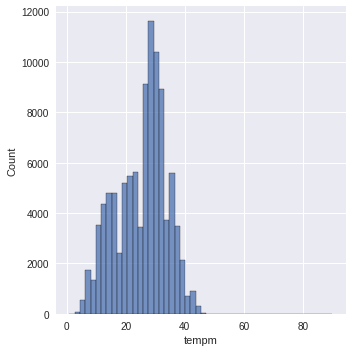

In [16]:
sns.displot(df_weather_tsm['tempm'], bins=50)
plt.show()

In [17]:
data_weather = df_weather_tsm[['datetimeutc','tempm']].copy()
data_weather['datetimeutc'] = pd.to_datetime(data_weather['datetimeutc'])
data_weather.set_index('datetimeutc', inplace = True)
data_weather.head()

,tempm
datetimeutc,
1996-11-01 11:00:00,30.0
1996-11-01 12:00:00,28.0
1996-11-01 13:00:00,24.0
1996-11-01 14:00:00,24.0
1996-11-01 16:00:00,23.0


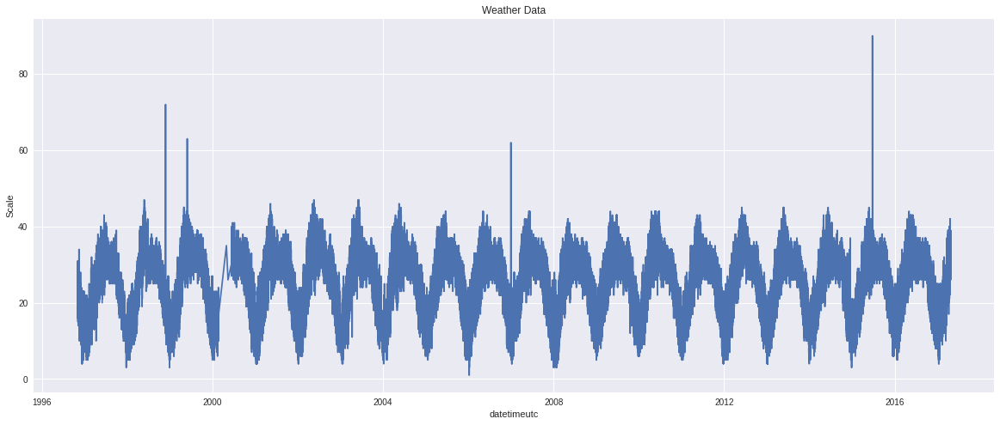

In [22]:
plt.figure(figsize=(20,8))
plt.plot(data_weather)
plt.title("Weather Data")
plt.xlabel('datetimeutc')
plt.ylabel('Scale')
plt.show()

Data Processing,
Modify columns to only using columns ('datetimeutc','tempm')

In [23]:
df_weather_tsm = df_weather_tsm[['datetimeutc','tempm']]

In [24]:
df_weather_tsm.head()

,datetimeutc,tempm
0,19961101-11:00,30.0
1,19961101-12:00,28.0
2,19961101-13:00,24.0
3,19961101-14:00,24.0
4,19961101-16:00,23.0


Change datetimeutc format string to dateTime type

In [25]:
df_weather_tsm['datetimeutc'] = pd.to_datetime(df_weather_tsm['datetimeutc']).dt.strftime('%Y-%m-%d %H:%M')
df_weather_tsm.sort_values('datetimeutc', inplace=True, ignore_index=True)
df_weather_tsm.head()

,datetimeutc,tempm
0,1996-11-01 11:00,30.0
1,1996-11-01 12:00,28.0
2,1996-11-01 13:00,24.0
3,1996-11-01 14:00,24.0
4,1996-11-01 16:00,23.0


Handling Missing Value

In [27]:
df_weather_tsm.isnull().any()

datetimeutc    False
tempm           True
dtype: bool

In [29]:
df_weather_tsm.isna().any()

datetimeutc    False
tempm           True
dtype: bool

In [30]:
df_weather_tsm['tempm'].fillna(df_weather_tsm['tempm'].mean(), inplace=True)

Show Outlier

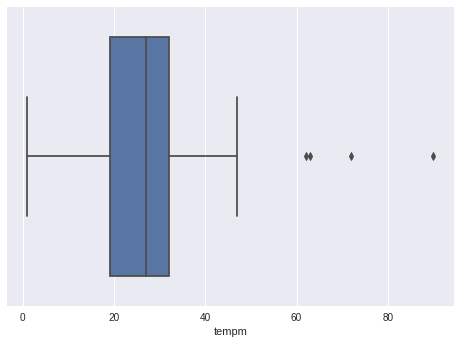

In [31]:
sns.boxplot(x=df_weather_tsm['tempm'])

Remove Outlier

In [33]:
Q1 = df_weather_tsm.quantile(0.25)
Q3 = df_weather_tsm.quantile(0.75)
print(Q1)
print(Q3)

IQR = Q3 - Q1
print(IQR)

tempm    19.0
Name: 0.25, dtype: float64
tempm    32.0
Name: 0.75, dtype: float64
tempm    13.0
dtype: float64


In [34]:
outlier = (df_weather_tsm < (Q1-1.5*IQR)) | (df_weather_tsm > (Q3-1.5*IQR))
pd.set_option('display.max_rows', outlier.shape[0]+1)
outlier[outlier['tempm'] == True]

,datetimeutc,tempm
0,False,True
1,False,True
2,False,True
3,False,True
4,False,True
5,False,True
6,False,True
7,False,True
8,False,True
9,False,True


In [36]:
df_weather_tsm_out = df_weather_tsm[~((df_weather_tsm < (Q1-1.5*IQR)) | (df_weather_tsm > (Q3-1.5*IQR))).any(axis=1)]
df_weather_tsm_out.shape

(9269, 2)

Normalization Data

In [37]:
from sklearn.preprocessing import MinMaxScaler
mx = MinMaxScaler()

In [38]:
df_weather_tsm['tempm'] = mx.fit_transform(df_weather_tsm[['tempm']])
df_weather_tsm.head()

,datetimeutc,tempm
0,1996-11-01 11:00,0.325843
1,1996-11-01 12:00,0.303371
2,1996-11-01 13:00,0.258427
3,1996-11-01 14:00,0.258427
4,1996-11-01 16:00,0.247191


Split Data

In [39]:
datetimne = df_weather_tsm['datetimeutc'].values
temp = df_weather_tsm['tempm'].values

In [40]:
datetimne

array(['1996-11-01 11:00', '1996-11-01 12:00', '1996-11-01 13:00', ...,
       '2017-04-24 12:00', '2017-04-24 15:00', '2017-04-24 18:00'],
      dtype=object)

In [41]:
temp

array([0.3258427 , 0.30337079, 0.25842697, ..., 0.39325843, 0.34831461,
       0.3258427 ])

Setting Data, 80% to Training set and 20% to Validation set

In [42]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(datetimne, temp, test_size = 0.2, random_state = 0, shuffle = False)

In [43]:
print(len(x_train), len(x_test))

80792 20198


Windowed

In [48]:
import tensorflow as tf

def windowed_dataset(series, window_size, batch_size, shuffle_buffer):
  series = tf.expand_dims(series, axis=1)
  ds = tf.data.Dataset.from_tensor_slices(series)
  ds = ds.window(window_size + 1, shift = 1, drop_remainder = True)
  ds = ds.flat_map(lambda w: w.batch(window_size + 1))
  ds = ds.shuffle(shuffle_buffer)
  ds = ds.map(lambda w: (w[: 1], w[-1:]))
  return ds.batch(batch_size).prefetch(1)

In [49]:
data_x_train = windowed_dataset(y_train, window_size=60, batch_size=100, shuffle_buffer=5000)
data_x_test = windowed_dataset(y_test, window_size=60, batch_size=100, shuffle_buffer=5000)

Data Modelling

In [50]:
from keras.layers import Dense, LSTM
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(32, 5, padding='causal',activation='relu', input_shape=[None, 1]),
    tf.keras.layers.LSTM(64, return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(30, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(1),
])

Callback

In [51]:
max = df_weather_tsm['tempm'].max()
min = df_weather_tsm['tempm'].min()

x = (max - min) * 0.1
print(x)

0.1


In [54]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('mae') < x and logs.get('val_mae') < x):
      self.model.stop_training = True
      print('Mae model < 10% of data')
callbacks = myCallback()

Train Model

In [55]:
optimizer = tf.keras.optimizers.SGD(learning_rate=1.0000e-04, momentum=0.9)
model.compile(loss=tf.keras.losses.Huber(),
              optimizer=optimizer,
              metrics=['mae'])

In [56]:
history = model.fit(
    data_x_train,
    epochs = 50,
    validation_data=(data_x_test),
    verbose=2,
    callbacks=[callbacks]
)

Epoch 1/50
808/808 - 20s - loss: 0.0198 - mae: 0.1734 - val_loss: 0.0082 - val_mae: 0.1099
Epoch 2/50
808/808 - 16s - loss: 0.0060 - mae: 0.0943 - val_loss: 0.0047 - val_mae: 0.0831
Mae model < 10% of data


Visualization Loss and MAE

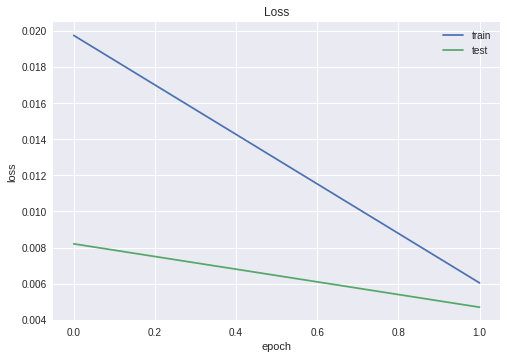

In [59]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

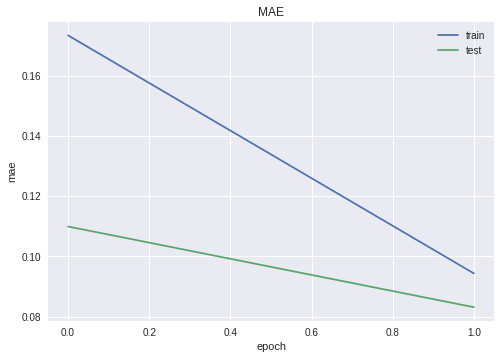

In [60]:
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.title('MAE')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()